#Electrocardiograms: models and data

*2015-02-20*

*Jiahao Chen and Jake Bolewski, MIT*

This notebook implements a model for electrocardiogram (ECG) signals that is described in:

Patrick E. McSharry, Gari D. Clifford, Lionel Tarassenko, and Leonard A. Smith, "A Dynamical Model for Generating Synthetic Electrocardiogram Signals", _IEEE Transactions in Biomedical Engineering_, 50(3), 2003, 289--294. [doi:10.1109/TBME.2003.808805](http://dx.doi.org/10.1109/TBME.2003.808805)

and compares the simulated data against some real patient data from the [Multiparameter Intelligent Monitoring in Intensive Care (MIMIC) II database](https://mimic.physionet.org/database.html).

(Note: there are several discrepancies between parameters used in the paper and the associated code posted [on PhysioNet.org](http://physionet.org/physiotools/ecgsyn/Matlab/), which are noted in comments. We use the parameters in the code where there is disagreement, as those in the paper do not reproduce the figures.)

In [1]:
using Color
using DataFrames
using Gadfly
using Interact
using ODE

In [2]:
#Change the plot size as necessary
set_default_plot_size(1000px, 400px)

In [3]:
function plot_heartbeats(t, mV)
    plot(x=t, y=mV,
         Coord.Cartesian(xmin=t[1], xmax=t[end]),
         Geom.line(preserve_order=true),
         Guide.ylabel("Signal (mV)"),
         Guide.xlabel("Time (s)"),
         Theme(default_color=color("black")))
end

plot_heartbeats (generic function with 1 method)

# A simplified model

Here is a version that computes a simplified model that leaves out time variation in the angular frequency parameter $\omega$. 

The necessary time variation comes from an auxiliary process called the RR process, and does not appear to change the simulated signal qualitatively. 

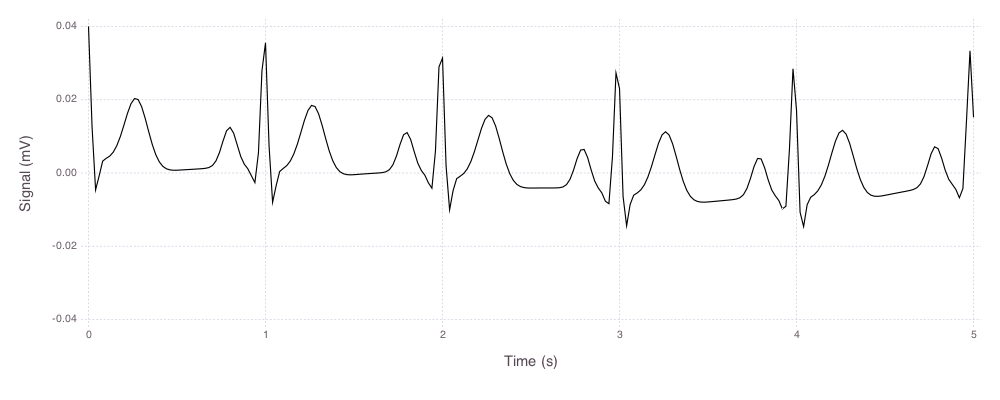

In [4]:
# Parameters  P    Q     R     S     T
a = [1.2, -5.0, 30.0, -7.5, 0.75] # gaussian peak position
b = [0.25, 0.1, 0.1, 0.1, 0.4]    # gaussian peak width
θ = deg2rad([-70, -15, 0, 15, 100])
#θ = [-π/3, -π/12, 0, π/12, -π/2] #Parameters in paper; don't look like their figures...

# This version leaves out the time dependence in ω
# A  respiratory amplitude (mV); default 0.005
#    Note: paper says 0.15, but code says 0.005
# f₂ respiratory frequency (Hz); default 0.25
function F(t, Y; A=0.005, f₂=0.25, aᵢ=a, bᵢ=b, θᵢ=θ)
    x, y, z = Y
    α = 1 - √(x^2 + y^2)
    ω = 2π
    z₀ = A*sin(2π*f₂*t) #Baseline signal from respiration
    ż = - (z - z₀)
    for i=1:5
        Δθ = rem(atan2(y, x)-θᵢ[i], 2π)
        ż -= aᵢ[i]*Δθ*exp(-Δθ^2/(2bᵢ[i]^2))
    end
    [α*x - ω*y, α*y + ω*x, ż]
end
ts, Ys = ode4(F, [1.0, 0.0, 0.04], 0:0.02:5);
plot_heartbeats(ts, [Y[3] for Y in Ys])

# Interacting with the simplified model

Julia makes it easy to explore model parameters and analyze the model interactively.

Here we modify the respiratory frequency parameter $f_2$ and the repiration voltage amplitude $A$. Interactive exploration allows us to peek inside the black box of the model and develop intuition.

Slider{Float64}([Input{Float64}] 0.025,"A",0.025,0.0:0.001:0.05)

Slider{Float64}([Input{Float64}] 1.0,"f₂",1.0,0.0:0.05:2.0)

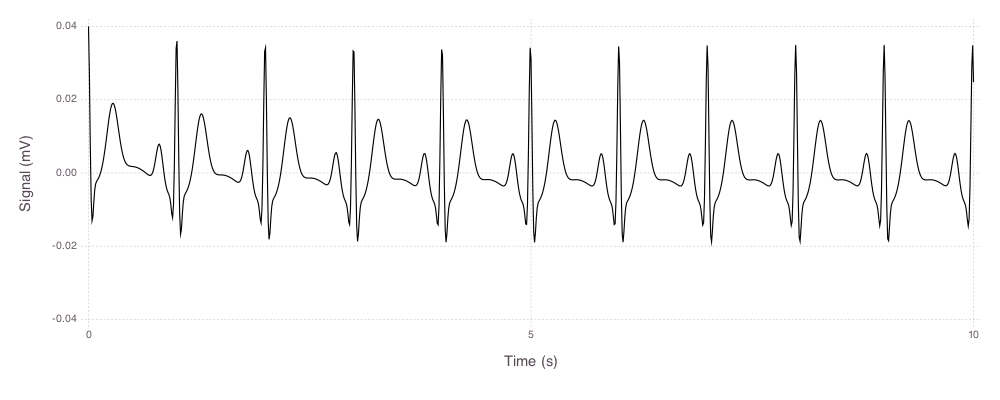

In [5]:
@manipulate for A = 0:0.001:0.05, f₂ = 0:0.05:2
    dY_dt = (t,Y) -> F(t, Y; A=A, f₂=f₂)
    ts, Ys = ode4(dY_dt, [1.0, 0.0, 0.04], 0:0.01:10);
    plot_heartbeats(ts, [Y[3] for Y in Ys])
end

Here we adjust the PQRST Gaussian peak widths $b$ and phase angles $\theta$.  We can quickly gain a sense for the sensitivity of the model to each parameter.

Slider{Float64}([Input{Float64}] 0.25,"b₁",0.25,0.0:0.05:0.5)

Slider{Float64}([Input{Float64}] 0.25,"b₂",0.25,0.0:0.05:0.5)

Slider{Float64}([Input{Float64}] 0.25,"b₃",0.25,0.0:0.05:0.5)

Slider{Float64}([Input{Float64}] 0.25,"b₄",0.25,0.0:0.05:0.5)

Slider{Float64}([Input{Float64}] 0.25,"b₅",0.25,0.0:0.05:0.5)

Slider{Float64}([Input{Float64}] -0.7853981633974483,"θ₁",-0.7853981633974483,-1.5707963267948966:0.2617993877991494:0.0)

Slider{Float64}([Input{Float64}] -0.7853981633974483,"θ₂",-0.7853981633974483,-1.5707963267948966:0.2617993877991494:0.0)

Slider{Float64}([Input{Float64}] 0.7853981633974483,"θ₄",0.7853981633974483,0.0:0.2617993877991494:1.5707963267948966)

Slider{Float64}([Input{Float64}] 0.7853981633974483,"θ₅",0.7853981633974483,0.0:0.2617993877991494:1.5707963267948966)

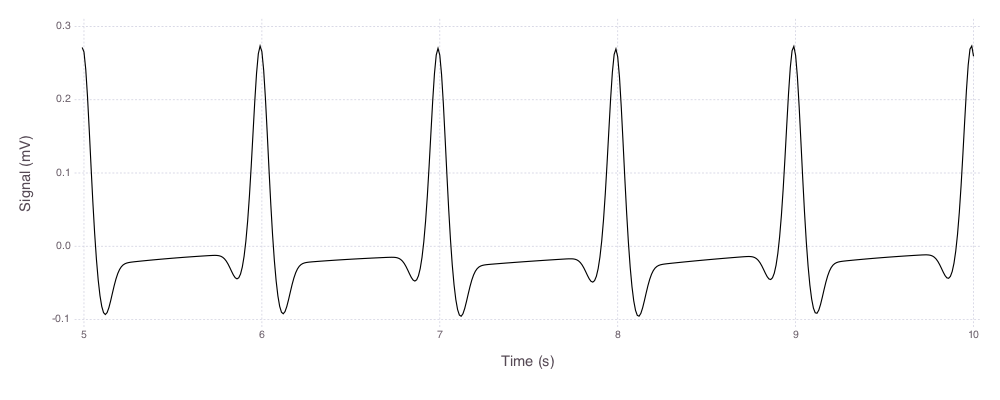

In [6]:
@manipulate for b₁ = 0:0.05:0.5,
                b₂ = 0:0.05:0.5,
                b₃ = 0:0.05:0.5,
                b₄ = 0:0.05:0.5,
                b₅ = 0:0.05:0.5,
        
                θ₁ = -(1/2)π:(π/12):0,
                θ₂ = -(1/2)π:(π/12):0,
                θ₄ = 0:(π/12):π/2,
                θ₅ = 0:(π/12):π/2
        
    bs = [b₁, b₂, b₃, b₄, b₅]
    θs = [θ₁, θ₂, 0, θ₄, θ₅]
    
    dY_dt = (t,Y) -> F(t, Y, bᵢ=bs, θᵢ=θs)
    ts, Ys = ode4(dY_dt, [1.0, 0.0, 0.04], 0:0.01:10)
    
    idx = length(ts) ÷ 2
    plot_heartbeats(ts[idx:end], [Y[3] for Y in Ys][idx:end])
end

# The full model

The simplified model assumes a constant angular velocity $\omega$ along the $x-y$ unit circle. The actual model in the reference has a time-varying angular velocity which is modulated by the RR process.

## The RR process

The RR process is a model of time intervals between successive heartbeats.

`RRpower` computes a model power spectrum $P$, which consists of two Gaussians in the frequency domain. From this power spectrum, we sample time series with this power spectrum using `powertotimeseries`. Finally we standardize the time series to provide a time series that fits a given distribution of heartbeat intervals (of given mean and standard deviation).


The parameters for the RR process model can be computed from patient heartbeat data.

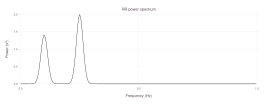

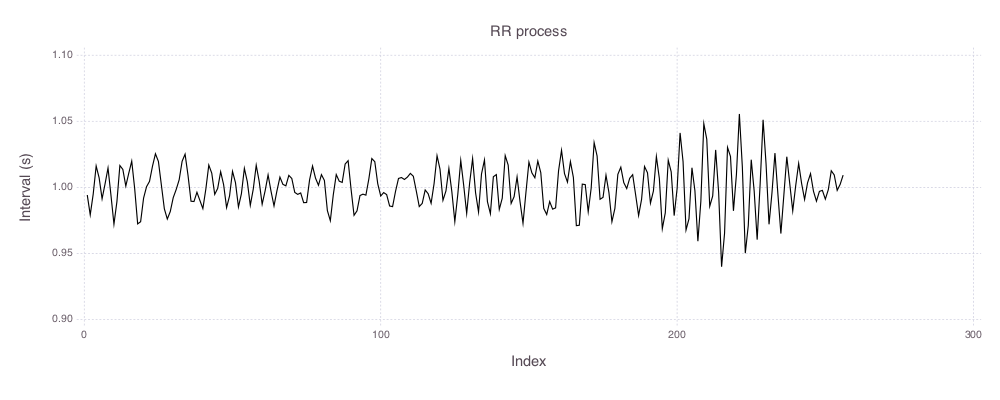

In [7]:
function RRpower{T<:Real}(
    n::Int=0, 
    f₁::T=0.1,
    f₂::T=0.25,
    f₁σ::T=0.01, 
    f₂σ::T=0.01,
    σ₁::Real=0.5, 
    samplefreq::Integer=1)
    
    #Convert from Hz to angular frequencies (rad/s)
    ω₁ = 2π*f₁
    ω₂ = 2π*f₂
    c₁ = 2π*f₁σ
    c₂ = 2π*f₂σ

    df = samplefreq/n
    P = zeros(n)
    for t=0:n-1
        ω = 2π*t*df
        P[t+1] = exp(-0.5*((ω-ω₁)/c₁)^2)*σ₁/c₁ +
                  exp(-0.5*((ω-ω₂)/c₂)^2)/c₂
    end
    return samplefreq/2 * √P
end

#Sample a time series from the given power distribution
function powertotimeseries(f)
    n = length(f)
    f = [f[1:n/2]; f[n/2:-1:1]]

    ϕ₀ = 2π*rand(int(n/2-1))
    ϕ = [0, ϕ₀..., 0, -flipud(ϕ₀)...]
    f̃ = f .* exp(im*ϕ)
    return real(ifft(f̃))/n
end

#Standardize data so that it has the given mean and standard deviation
function standardize(data, μ=0.0, σ=1.0)
    normed = (data - mean(data))/std(data)
    return μ .+ σ * normed
end

Nrr = 256
P = RRpower(Nrr)
draw(SVG(1000px, 400px), plot(Guide.title("RR power spectrum"),
    Guide.xlabel("Frequency (Hz)"), Guide.ylabel("Power (s³)"),
    x=0:1/Nrr:1, y=P, Geom.line, Theme(default_color=color("black"))))

#Heart beat mean and std dev in beats per minute
heartμ=60
heartσ=1 
Ts = standardize(powertotimeseries(P), 60/heartμ, 60*heartσ/(heartμ^2))

plot(Guide.title("RR process"), Guide.xlabel("Index"), Guide.ylabel("Interval (s)"),
    x=1:Nrr, y=Ts, Geom.line, Theme(default_color=color("black")))

## Computing the full model

Here is a more elaborate version of the right hand side function which allows for the RR time series to be input.

As can be seen, the default RR model does not appear to change the simulated ECG signal qualitatively.

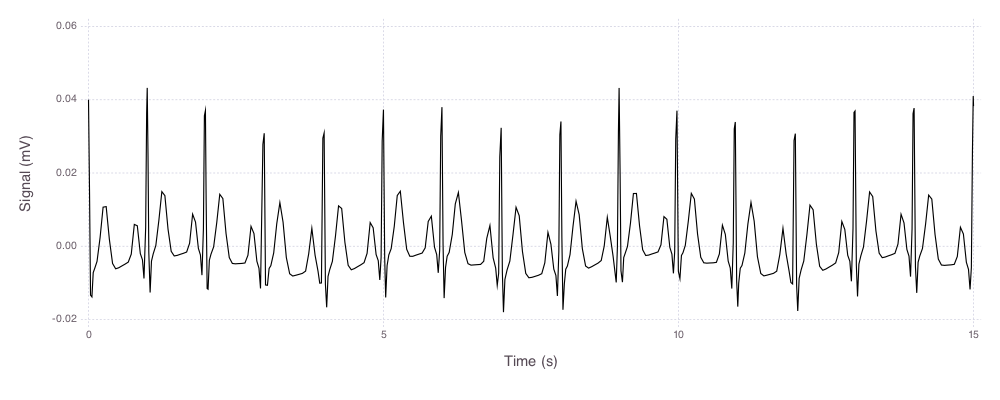

In [8]:
# This version puts in the time dependence in ω
# The instantaneous ω is calculated from the time
# series T with assumed frequency f in Hz
# A  respiratory amplitude (mV); default 0.005
#    Note: paper says 0.15, but code says 0.005
# f₂ respiratory frequency (Hz); default 0.25
function F(t, Y; A=0.005, f₂=0.25, T=Ts, f=1.0)
    x, y, z = Y
    α = 1 - √(x^2 + y^2)
    tidx = 1 + int(floor(t*f))
    ω = 2π/T[tidx]
    z₀ = A*sin(2π*f₂*t) #Baseline signal from respiration
    ż = - (z - z₀)
    for i=1:5
        Δθ = rem(atan2(y, x)-θ[i], 2π)
        ż -= a[i]*Δθ*exp(-Δθ^2/(2b[i]^2))
    end
    [α*x - ω*y, α*y + ω*x, ż]
end

ts, Ys = ode45(F, [1.0, 0.0, 0.04], 0:0.02:15)
plot_heartbeats(ts, [Y[3] for Y in Ys])

# What happens when you SVD this?

We now look at what the singular value decomposition (SVD) can tell us about families of related time series. Such families can be generated easily from the heartbeat model in many different ways.

## Case 1. Different initial voltage (z0)

In [9]:
tr = 0:0.02:5
data = zeros(length(tr), 0)
for z0=-0.05:0.01:0.05
    ts, Ys = ode4(F, [1.0, 0.0, z0], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

In [10]:
#Plot a given left and right singular vector and also its position in the spectrum of singular values
function svdexplorer(S::Base.LinAlg.SVD, i::Int)
    # Reconstruct dimensions of matrix that was SVDed
    m = size(S[:U], 1) 
    n = size(S[:V], 2)
    ns= size(S[:S], 1)

    leftcolors = reverse(Color.colormap("Reds", ns+1))
    rightcolors = reverse(Color.colormap("Blues", ns+1))
    
    hstack(
        #Left singular vector
        plot(x=1:m, y=sub(S[:U],:,i), Geom.line,
            Theme(default_color=leftcolors[i]),
            Coord.Cartesian(xmin=1, xmax=m),
            Guide.xlabel("Time"), Guide.ylabel(""),
            Guide.title("U[$i]")),
    
        #Singular values
        plot(x=1:ns, y=S[:S], Geom.point, Geom.line, 
            xintercept = [i], Geom.vline,
            Theme(default_color=color("black")),
            Guide.xlabel("Rank"), Guide.ylabel(""),
            Guide.title("σ[$i] = $(@sprintf("%0.3f", S[:S][i]))")),
    
        #Right singular vector
        plot(x=1:n, y=sub(S[:Vt],i,:), Geom.bar,
            Theme(default_color=rightcolors[i]),
            yintercept=[-1/√n, +1/√n], Geom.hline,
            Guide.xlabel("Record id"), Guide.ylabel(""),
            Coord.Cartesian(xmin=0.5, xmax=n+0.5, ymin=-1.0, ymax=1.0),
            Guide.title("V[$i]")),
    )
end

svdexplorer (generic function with 1 method)

elapsed time: 0.11779214 seconds (2364672 bytes allocated)
elapsed time: 9.595343851 seconds (215129124 bytes allocated, 2.30% gc time)


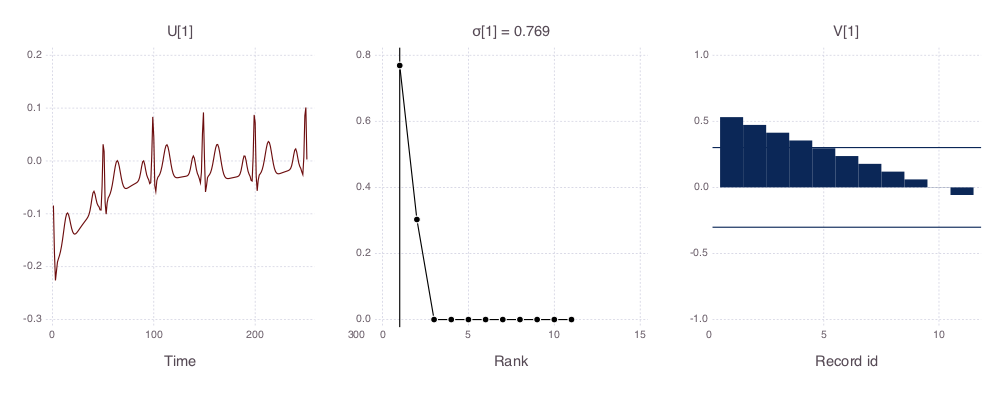

In [11]:
@time S1 = svdfact!(data)
@time svdexplorer(S1, 1)

Slider{Int64}([Input{Int64}] 6,"i",6,1:11)

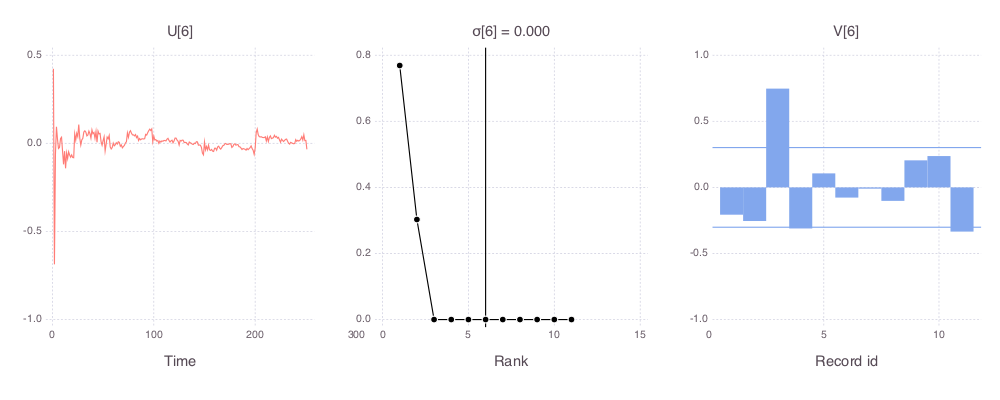

In [12]:
@manipulate for i=1:size(S1[:S], 1)
    svdexplorer(S1, i)
end

## Case 2. Different initial phases

In [13]:
tr = 0:0.02:5
data = zeros(length(tr), 0)
for θ₀=-π:π/6:π
    ts, Ys = ode4(F, [cos(θ₀), sin(θ₀), 0.04], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

elapsed time: 0.001710809 seconds (37552 bytes allocated)
elapsed time: 0.201603085 seconds (12547296 bytes allocated)


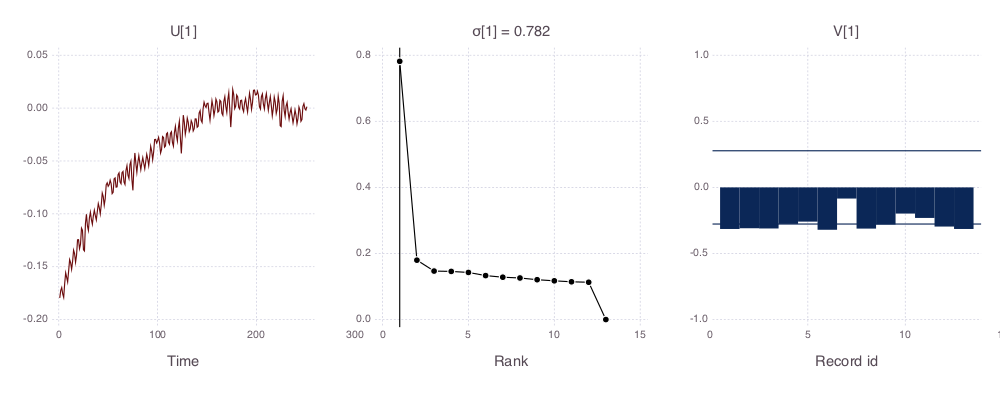

In [14]:
@time S2 = svdfact!(data)
@time svdexplorer(S2, 1)

Slider{Int64}([Input{Int64}] 7,"i",7,1:13)

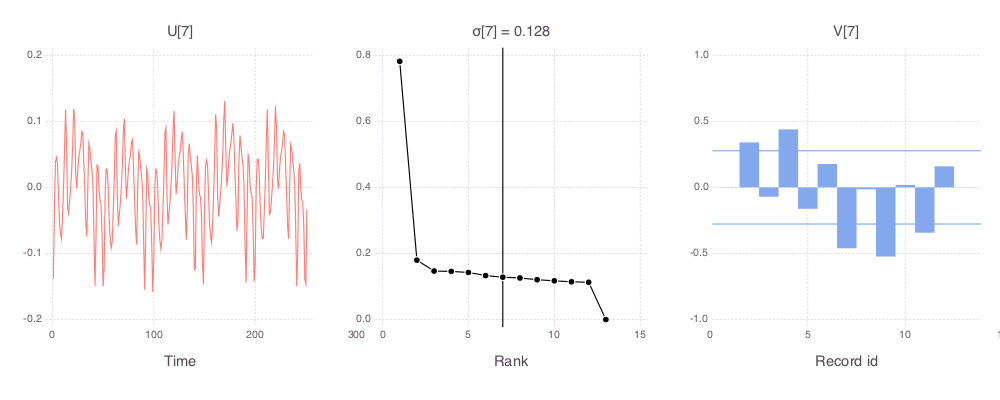

In [15]:
@manipulate for i=1:size(S2[:S], 1)
    svdexplorer(S2, i)
end

## Case 3. Sample different RR time series

In [16]:
tr = 0:0.02:5
data = zeros(length(tr), 0)
for i=1:20
    Ts = standardize(powertotimeseries(P), 60/heartμ, 60*heartσ/(heartμ^2))
    ts, Ys = ode4(F, [1.0, 0.0, 0.04], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

elapsed time: 0.001380475 seconds (59616 bytes allocated)
elapsed time: 0.21779598 seconds (13621120 bytes allocated)


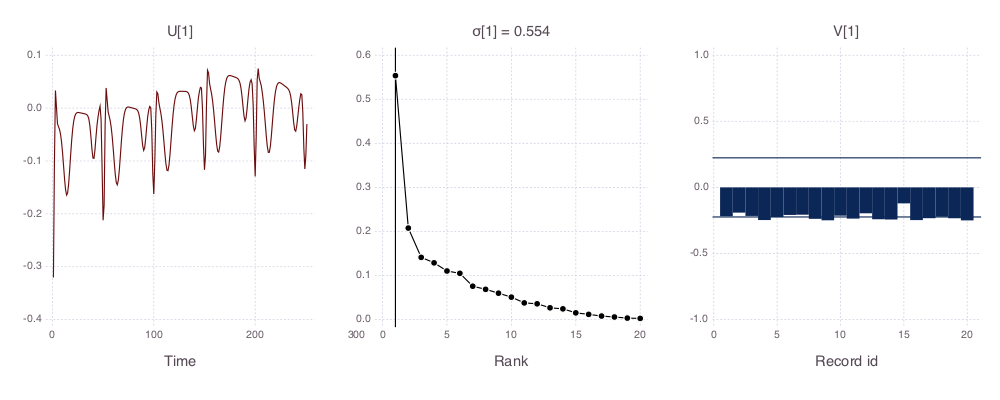

In [17]:
@time S3 = svdfact!(data)
@time svdexplorer(S3, 1)

Slider{Int64}([Input{Int64}] 10,"i",10,1:20)

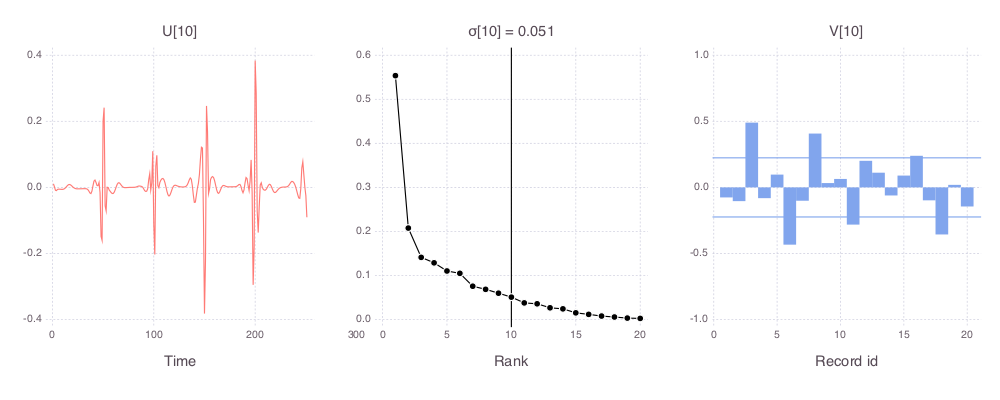

In [18]:
@manipulate for i=1:size(S3[:S], 1)
    svdexplorer(S3, i)
end

## Case 4. Realistic variations in heart beat rate and variability

Let's try some real data from the literature.

The table below is from

Ken Umetani, Donald H Singer, Rollin McCraty, and Mike Atkinson, "Twenty-Four Hour Time Domain Heart Rate Variability and Heart Rate: Relations to Age and Gender Over Nine Decades", _Journal of the American College of Cardiology_, 31 (3), 1998. [doi:10.1016/S0735-1097(97)00554-8](http://content.onlinejacc.org/article.aspx?articleid=1124431)

**Table 2. Aging Effects on 24-h Heart Rate Variability and Heart Rate by Decade**

<table><thead><tr><th align="center">Age (yr)</th><th align="center">SDNN (ms)</th><th align="center">SDANN (ms)</th><th align="center">SDNN Index (ms)</th><th align="center">rMSSD (ms)</th><th align="center">pNN50 (%)</th><th align="center">HR (beats/min)</th></tr></thead><tbody><tr><td align="">10–19</td><td align="center">176 ± 38</td><td align="center">159 ± 35</td><td align="center">81 ± 20</td><td align="center">53 ± 17</td><td align="center">25 ± 13</td><td align="center">80 ± 10</td></tr><tr><td align="">20–29</td><td align="center">153 ± 44</td><td align="center">137 ± 43</td><td align="center">72 ± 22</td><td align="center">43 ± 19</td><td align="center">18 ± 13</td><td align="center">79 ± 10</td></tr><tr><td align="">30–39</td><td align="center">143 ± 32<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">130 ± 33</td><td align="center">64 ± 15<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">35 ± 11<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">13 ± 9<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">78 ± 7</td></tr><tr><td align="">40–49</td><td align="center">132 ± 30<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">116 ± 31<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">60 ± 13<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">31 ± 11<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">10 ± 9<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">78 ± 7</td></tr><tr><td align="">50–59</td><td align="center">121 ± 27<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">106 ± 27<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">52 ± 15<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">25 ± 9<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">6 ± 6<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">76 ± 9</td></tr><tr><td align="">60–69</td><td align="center">121 ± 32<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">111 ± 31<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">42 ± 13<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong><strong data="tblfn4"><sup>d</sup></strong></td><td align="center">22 ± 6<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">4 ± 5<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">77 ± 9</td></tr><tr><td align="">70–79</td><td align="center">124 ± 22<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">114 ± 20<strong data="tblfn1"><sup>a</sup></strong></td><td align="center">43 ± 11<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong><strong data="tblfn4"><sup>d</sup></strong></td><td align="center">24 ± 7<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">4 ± 5<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong></td><td align="center">72 ± 9</td></tr><tr><td align="">80–99</td><td align="center">106 ± 23<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">95 ± 24<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">37 ± 12<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong><strong data="tblfn4"><sup>d</sup></strong></td><td align="center">21 ± 6<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">3 ± 3<strong data="tblfn1"><sup>a</sup></strong><strong data="tblfn2"><sup>b</sup></strong><strong data="tblfn3"><sup>c</sup></strong></td><td align="center">73 ± 10</td></tr></tbody></table></div></div></div></div><div class="tableFoot"><div class="para clearfix"><a name="489670"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">a</span>p &lt; 0.05, other age ranges versus 10 to 19 years.</div><div class="para clearfix"><a name="489672"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">b</span>p &lt; 0.05, other age ranges versus 20 to 29 years.</div><div class="para clearfix"><a name="489674"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">c</span>p &lt; 0.05, other age ranges versus 30 to 39 years.</div><div class="para clearfix"><a name="489676"><span style="display:none">Table Footer Note</span></a><span class="tableFootLabel">d</span>p &lt; 0.05, other age ranges versus 40 to 49 years. Data presented are mean value ± SD. HR = heart rate; pNN50 = percentage of successive normal sinus RR intervals >50 ms; rMSSD = root-mean-square of the successive normal sinus RR interval difference; SDANN = standard deviation of the averaged normal sinus RR intervals for all 5-min segments; SDNN = standard deviation of all normal sinus RR intervals over 24 h; SDNN index = mean of the standard deviations of all normal sinus RR intervals for all 5-min segments.

In [19]:
npatients = 65 #Same as in the study
tr = 0:0.02:300 #seconds
data = zeros(length(tr), 0)
for i=1:npatients
    heartμ = randn()*7 + 78 #HR in bpm, 40-49 year olds
    heartσ = randn()*0.031 + 0.116 #SDANN, 40-49 year olds
    P = RRpower(2*int(300(60/heartμ)))
    Ts = standardize(powertotimeseries(P), 60/heartμ, heartσ)
    ts, Ys = ode4(F, [1.0, 0.0, 0.04], tr)
    signal = Float64[y[3] for y in Ys]
    data = [data signal]
end

Slider{Int64}([Input{Int64}] 33,"patient_id",33,1:65)

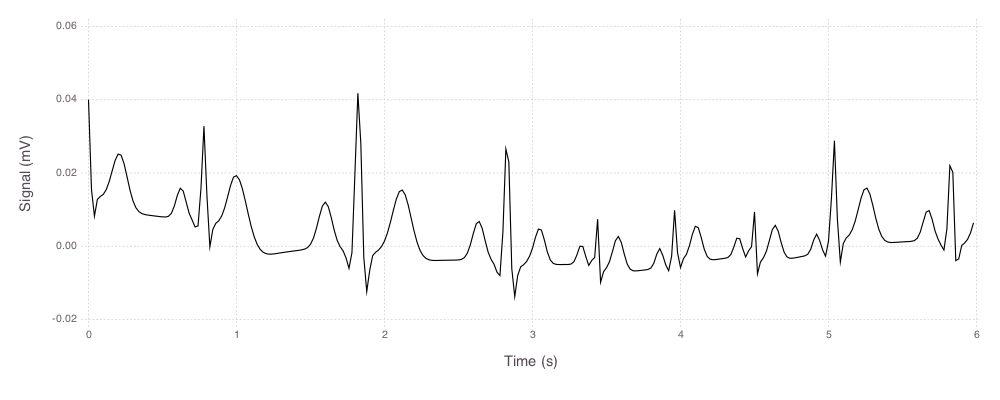

In [20]:
#Inspect the data
@manipulate for patient_id=1:npatients
    plot_heartbeats(ts[1:300], data[1:300, patient_id])
end

elapsed time: 0.23869571 seconds (15960204 bytes allocated)
elapsed time: 1.137011719 seconds (52558596 bytes allocated, 9.13% gc time)


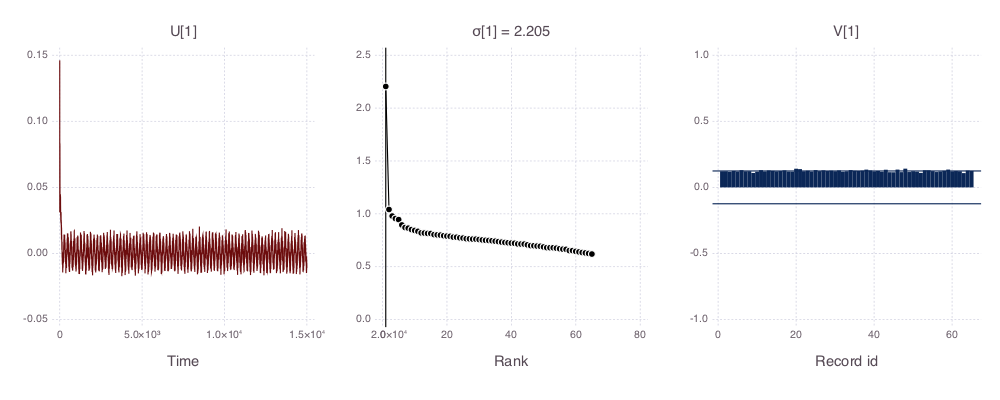

In [21]:
@time S4 = svdfact(data)
@time svdexplorer(S4, 1)

Slider{Int64}([Input{Int64}] 33,"i",33,1:65)

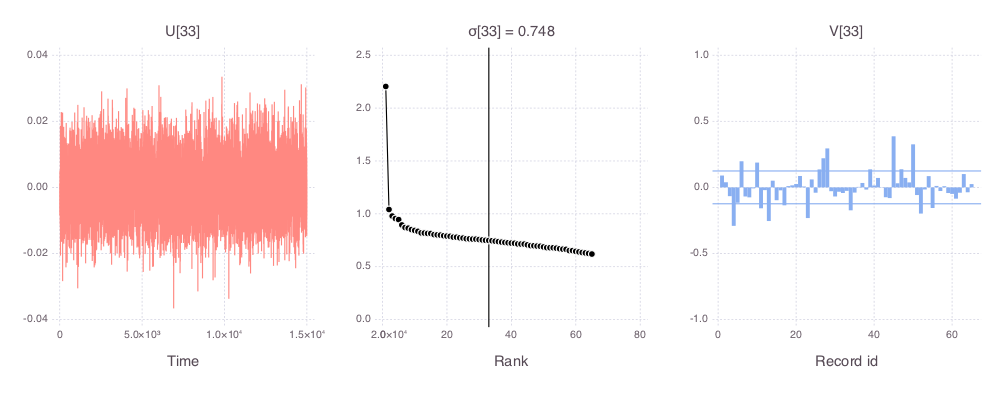

In [22]:
@manipulate for i=1:size(S4[:S], 1)
    svdexplorer(S4, i)
end

Slider{Int64}([Input{Int64}] 33,"i",33,1:65)

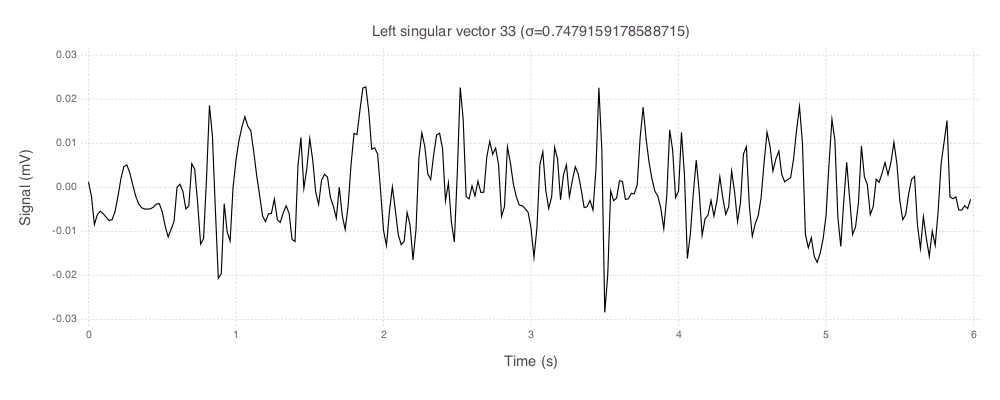

In [23]:
#Inspect the results of the SVD
@manipulate for i=1:size(S4[:S], 1)
    plot(Guide.xlabel("Time (s)"), Guide.ylabel("Signal (mV)"), Guide.title("Left singular vector $i (σ=$(S4[:S][i]))"),
         x=ts[1:300], y=S4[:U][1:300,i], Geom.line(preserve_order=true), Theme(default_color=color("black")))
end

# Comparing the model to real MIMIC heartbeat data

Here we load in some representative ECG data from the MIMIC dataset.  

This raw data is from patient ID 3482117, representing 20 different 8 minute snapshots of ECG data sampled at 125 HZ.

In [24]:
path = pwd()
if !("hbeatdata" in readdir(path))
    error("""Cannot find hbeatdata directory in $path.
          Please change the path variable in this cell and try again.""")
end
HB_filenames = readdir(joinpath(path, "hbeatdata"))
HB_filepaths = map(p -> joinpath(path, "hbeatdata", p), HB_filenames)
rawdata = [readtable(p) for p in HB_filepaths]
println("Loaded $(length(rawdata)) files.")

Loaded 20 files.


In [25]:
#rawdata[1]

To run the SVD we first need to clean up the parsed raw data and build an observation matrix.

First we reject any ECG traces that have missing values, or are all zero voltage.  We then convert voltage data from the DataFrame object into a Julia Array and select the first 10,000 datapoints (about 1.3 minutes of data at 125 Hz).  Finally, we concat all the vectors together to build our matrix in order to perform the SVD.  The rows of the matrix are the voltage values for each timepoint, the columns are the different heartbeat traces from patient ID 3482117.

In [26]:
# filter raw heatbeat data
records = Array[]
for df in rawdata
    if !anyna(df[:mV]) && !all(v -> v == 0, df[:mV])
        push!(records, convert(Array, df[:mV][1:10_000]))
    end
end
hbeats = hcat(records...);

We want to visualize the heartbeat data to do a quick sanity check of the raw data.  

**Note** We are omitting preprocessing steps which would be required for any serious analysis of the raw data.

In [27]:
#Function to plot raw data
function plotraw(data)
    m, n = size(data)
    cmap = Color.distinguishable_colors(n)
    plot(Guide.xlabel("Time (ms)"), Guide.ylabel(""), Guide.title("Raw data"),
         Coord.Cartesian(ymin=-0.5, ymax=0.5),
         [layer(x=1:8:(m*8), 
                y=sub(data,:,i), Geom.line,
                Theme(default_color=cmap[i])) for i in 1:n]...)
end

plotraw (generic function with 1 method)

Slider{Int64}([Input{Int64}] 6,"record\u1d62",6,1:12)

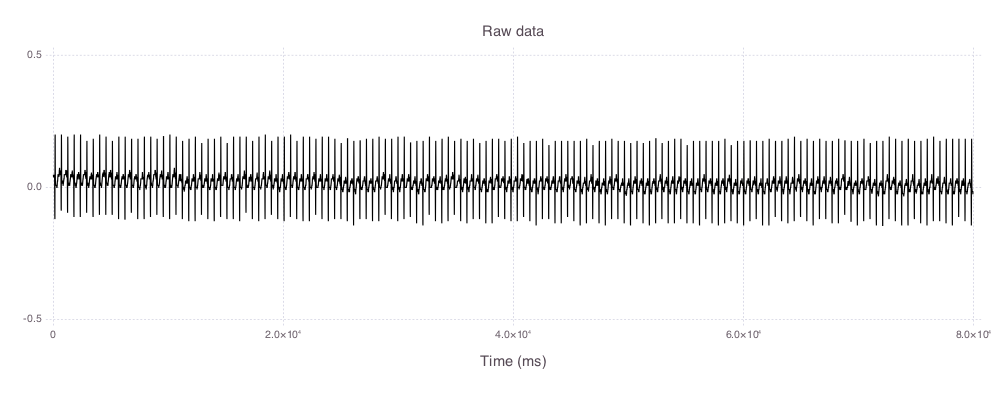

In [28]:
@manipulate for recordᵢ=1:size(hbeats, 2)
    plotraw(hbeats[:, recordᵢ:recordᵢ])
end

It is apparent that the last two heartbeat traces are a bit wonky.  Something went wrong with data collection or with our pipeline to read in the data from the binary waveform files.  This needs more investiagation, but for now lets just throw out the last two columns of our observation matrix.   

In [29]:
# extract out patients data that makes sense
obsmat = copy(sub(hbeats, :, 1:10))

10000x10 Array{Float64,2}:
 -0.15625    -0.131313   0.024   0.0    …  0.0     0.0     0.056   0.025974 
 -0.0729167  -0.0707071  0.016   0.0       0.0     0.0     0.048   0.038961 
 -0.0104167  -0.010101   0.056   0.0       0.008   0.008   0.0     0.038961 
  0.03125     0.010101   0.072   0.0       0.008   0.008  -0.064   0.038961 
  0.0416667   0.020202   0.064   0.0       0.008  -0.016  -0.096   0.025974 
  0.0520833   0.030303   0.04    0.008  …  0.008  -0.08    0.0     0.025974 
  0.0520833   0.040404   0.032   0.008     0.008  -0.144   0.152   0.038961 
  0.0520833   0.030303   0.032   0.008     0.008  -0.104   0.176   0.038961 
  0.0520833   0.030303   0.04    0.016     0.016   0.056   0.088   0.025974 
  0.0520833   0.030303   0.056   0.016     0.016   0.168   0.032  -0.012987 
  0.0520833   0.020202   0.08    0.024  …  0.016   0.112   0.016  -0.0779221
  0.0520833   0.020202   0.096   0.024     0.016   0.032   0.008  -0.103896 
  0.0520833   0.020202   0.088   0.032     0.016 

Slider{Int64}([Input{Int64}] 5,"record\u1d62",5,1:10)

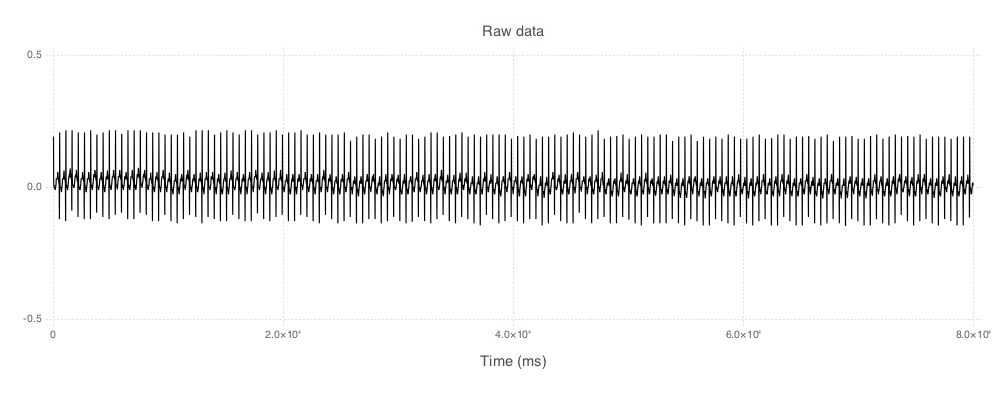

In [30]:
@manipulate for recordᵢ=1:size(obsmat, 2)
    plotraw(obsmat[:, recordᵢ:recordᵢ])
end

### Exploring the SVD of the raw heartbeat data

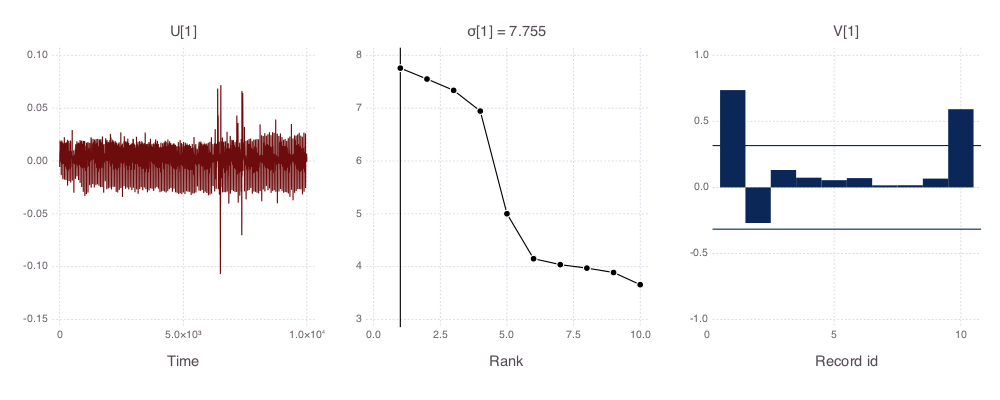

In [31]:
S5 = svdfact(obsmat)
svdexplorer(S5, 1)

Slider{Int64}([Input{Int64}] 5,"sval",5,1:10)

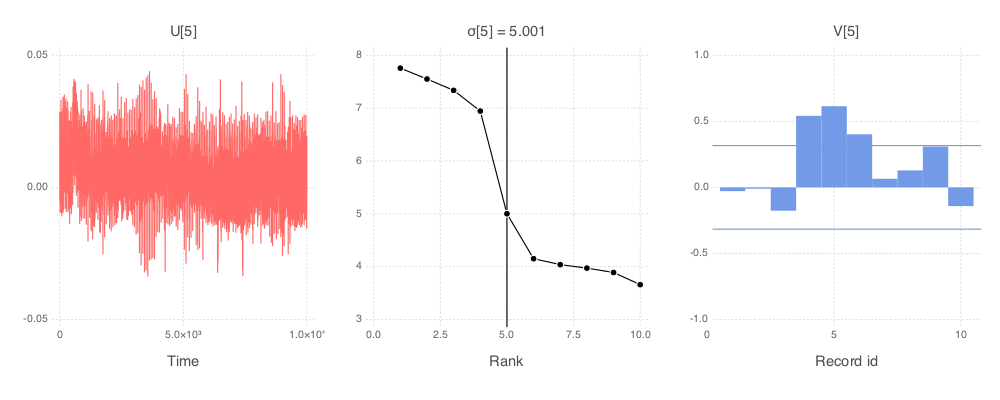

In [32]:
@manipulate for sval = 1:size(S5[:S], 1)
    svdexplorer(S5, sval)
end

We can inspect the results of the SVD more closely by zooming into different regions of the singular vectors interactively.

In [33]:
function plot_left_singular(S::Base.LinAlg.SVD, i::Integer=1; range::Union(Range, Colon)=:)
    m  = size(S[:U], 1) # Reconstruct dimensions of matrix that was SVDed
    n  = size(S[:V], 2)
    ns = size(S[:S], 1)
    
    leftcolors = reverse(colormap("Reds", ns+1))
    rightcolors = reverse(colormap("Blues", ns+1))

    isa(range, Colon) && (range = 1:m)
    xdata = range
    ydata = sub(S[:U], range, i)
    
    plot(x=xdata*8, y=ydata, Geom.line,
         Theme(default_color=leftcolors[i]),
         Coord.Cartesian(xmin=xdata.start*8, xmax=xdata.stop*8),
         Guide.xlabel("Time (ms)"), 
         Guide.ylabel(""),
         Guide.title("Left singular vector $i (σ = $(S[:S][i]))"))
end

plot_left_singular (generic function with 2 methods)

Slider{Int64}([Input{Int64}] 5,"sval",5,1:10)

Slider{Int64}([Input{Int64}] 4501,"lbound",4501,1:500:9501)

Slider{Int64}([Input{Int64}] 4501,"ubound",4501,1:500:9501)

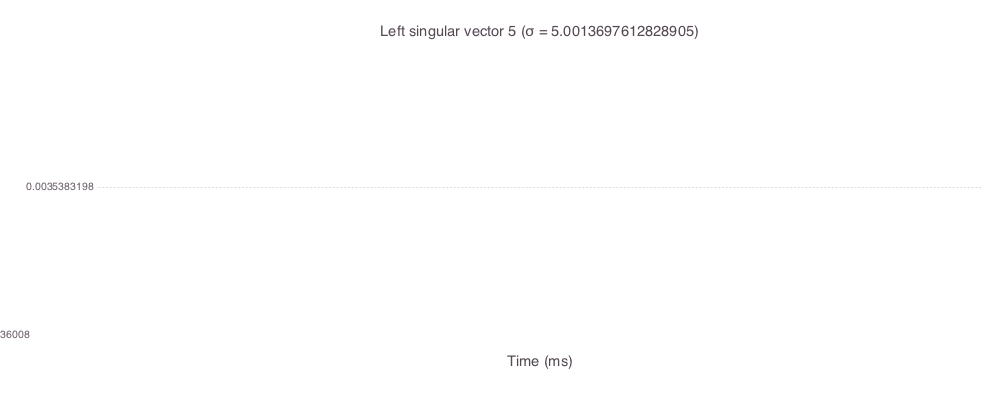

In [34]:
@manipulate for sval = 1:size(S5[:S], 1),
                lbound = 1:500:size(S5[:U], 1),
                ubound = 1:500:size(S5[:U], 1)
    lbound = min(lbound, ubound)
    ubound = max(lbound, ubound)
    plot_left_singular(S5, sval, range=lbound:ubound)
end

# Postscript

It is clear that the raw ECG data from actual patients requires significant cleanup before we can analyze it with sophisticated tools. Nevertheless, we can already see how effective the SVD is at picking out representative ECG signals from the data.

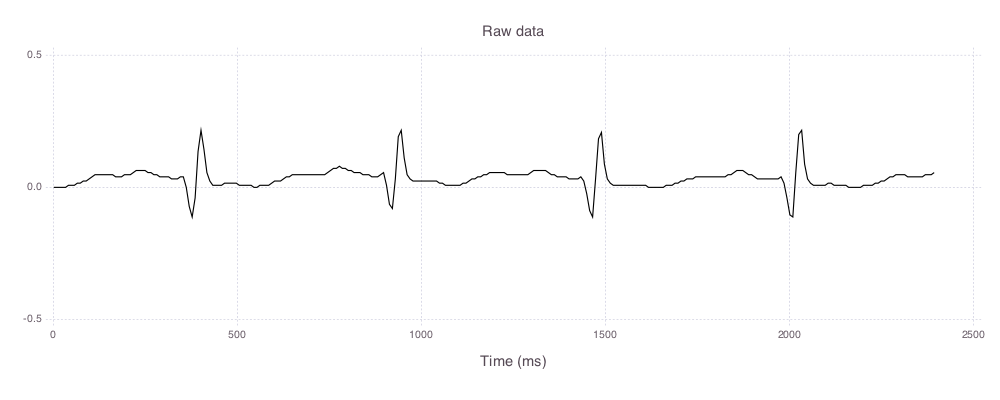

In [147]:
patient = 4
data = obsmat[:, patient:patient]
plotraw(data[1:300,:])

In [148]:
function findpeaks(data, minspacing::Int=0)
    d=diff(data)
    upeaks=Int[]
    dpeaks=Int[]
    inplateau = false
    zerostart = (0, zero(eltype(data)), zero(eltype(data)))
    for i=1:length(data)-2
        if !inplateau #Find sharp peaks or onset of plateau
            if d[i+1]<0 && d[i] > 0
                push!(upeaks, data[i+1] > data[i] ? i+1 : i)
            elseif d[i+1]>0 && d[i] < 0
                push!(dpeaks, data[i+1] > data[i] ? i : i+1)
            elseif d[i+1]==0 #Shallow up peak
                zerostart = (i, data[i], d[i])
                inplateau = true
            end
        else #Tracing a flat peak
            if d[i+1] != 0
                inplateau = false
                
                #make sure we actually have a change in gradient
                d[i+1] * zerostart[3] < 0 || continue
                
                #We have a problem where
                #at zerostart[1], the value is zerostart[2] and the 
                # gradient was zerostart[3]
                #at i+1, the value is data[i+1] and the gradient is d[i+1]
                #Find the intersection point!
                s1 = zerostart[3]
                s2 = d[i+1]
                pk = (s1*zerostart[1] - s2*(i+1))/(s1 - s2)
                peak = round(Int, pk)

                if s2<0 #&& s1 > 0
                    push!(upeaks, peak)
                else #if s2>0 && s1 < 0
                    push!(dpeaks, peak)
                end
            end
        end
    end
    upeaks, dpeaks
end
ups, dps = findpeaks(data[1:1000, :])

([18,30,45,51,61,98,113,119,151,166  …  856,863,895,909,924,930,947,977,991,998],[23,42,48,55,69,110,116,136,158,177  …  851,860,881,902,921,927,946,948,986,995])

In [149]:
#Function to plot raw data
function plotraw(data, pts=[])
    m, n = size(data)
    cmap = Color.distinguishable_colors(n)
    xs = 1:8:(m*8)
    plot(Guide.xlabel("Time (ms)"), Guide.ylabel(""), Guide.title("Raw data"),
         Coord.Cartesian(ymin=-0.5, ymax=0.5),
        [layer(x=xs,
                y=sub(data,:,i), Geom.line,
                Theme(default_color=cmap[i])) for i in 1:n]...,
    layer(x=xs[pts], y=data[pts], Geom.point, Theme(default_color=color("red"))))
end

plotraw (generic function with 2 methods)

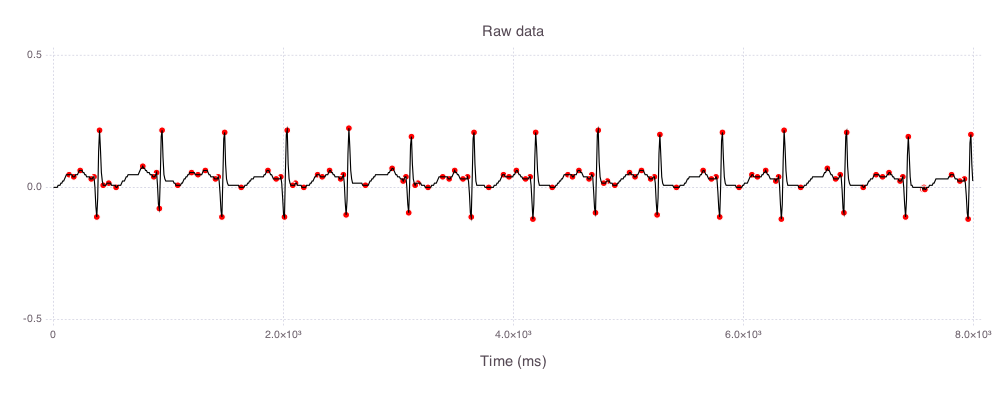

In [150]:
plotraw(data[1:1000, :], [ups..., dps...])

In [151]:
ups, dps = findpeaks(data[1:1000, 1:1])
m1, m2 = maximum(data[ups]), minimum(data[dps])

(0.224,-0.12)

In [169]:
#Check if we are flipped, and find the R peaks
tol=0.15
if abs(m1) > abs(m2) #Normal case, assign up peaks to R spike
    inverted = false
    Rs = filter(i->abs((data[i]-m1)/m1) < tol, ups)
else
    inverted = true
    Rs = filter(i->abs((data[i]-m2)/m2) < tol, dps)
end

15-element Array{Int64,1}:
  51
 119
 187
 255
 322
 390
 458
 525
 593
 660
 728
 795
 863
 930
 998

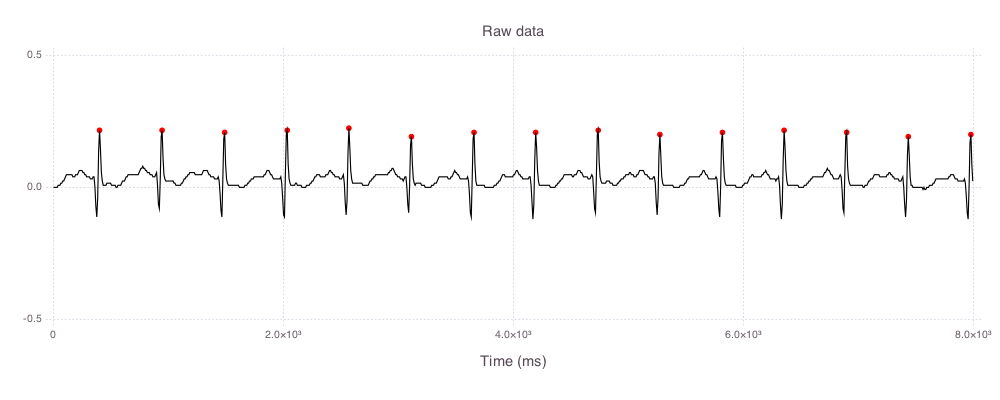

In [170]:
plotraw((inverted ? (-1):(1))*data[1:1000, :], Rs)

In [171]:
#Compute statistics of mean time between Rs
mean(diff(Rs)), std(diff(Rs))/√(length(Rs)-1)

(67.64285714285714,0.13289435848843764)

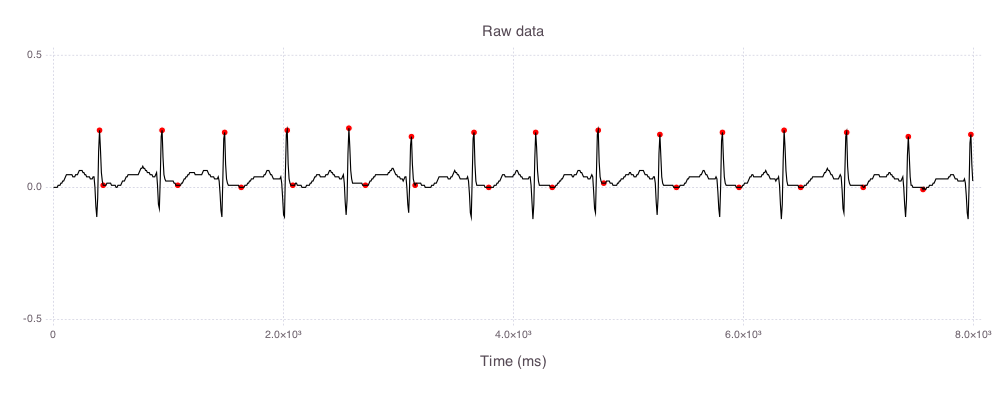

In [175]:
#find Ss
Ss=Int[]
for i=1:length(Rs)
    j=findfirst(x->x>Rs[i], inverted ? ups : dps)
    j==0 && continue
    push!(Ss, (inverted ? ups : dps)[j])
end
plotraw((inverted ? (-1):(1))*data[1:1000, :], [Rs..., Ss...])

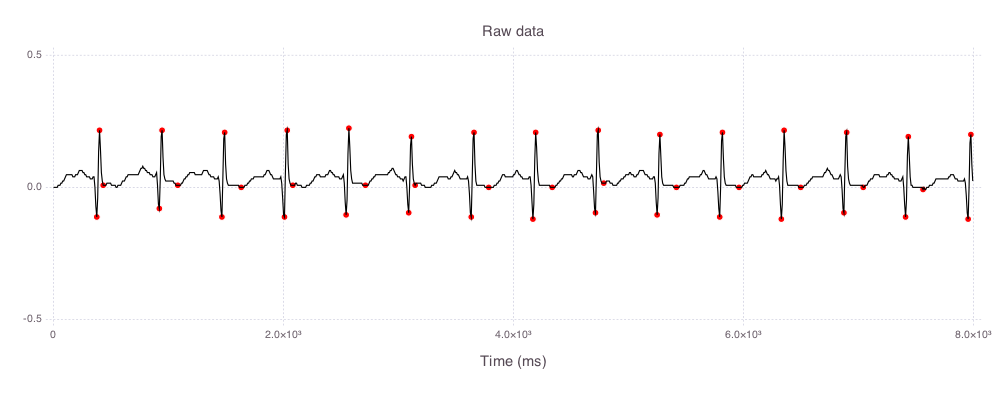

In [176]:
#find Qs
Qs=Int[]
for i=1:length(Rs)
    candidates = reverse(inverted ? ups : dps)
    j=findfirst(x->x<Rs[i], candidates)
    j==0 && continue
    push!(Qs, candidates[j])
end
plotraw((inverted ? (-1):(1))*data[1:1000, :], [Qs..., Rs..., Ss...])

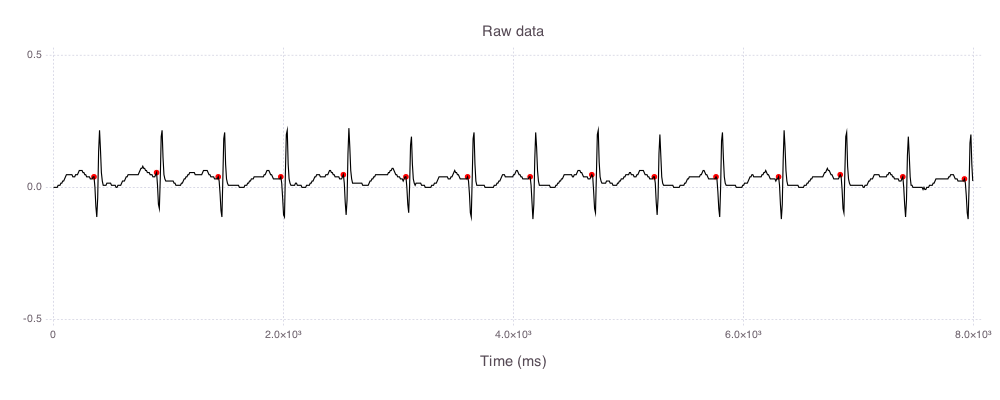

In [177]:
#find Ps
Ps=Int[]
for i=1:length(Qs)
    candidates = reverse(inverted ? dps : ups)
    j=findfirst(x->x<Qs[i], candidates)
    j==0 && continue
    push!(Ps, candidates[j])
end
plotraw((inverted ? (-1):(1))*data[1:1000, :], Ps)

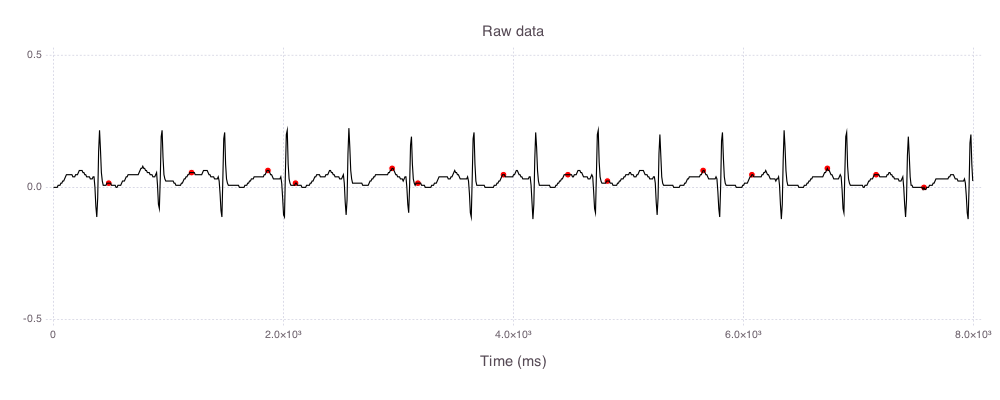

In [178]:
#find Ts
Ts=Int[]
for i=1:length(Ss)
    candidates = inverted ? dps : ups
    j=findfirst(x->x>Ss[i], candidates)
    j==0 && continue
    push!(Ts, candidates[j])
end
plotraw((inverted ? (-1):(1))*data[1:1000, :], Ts)

The P and T components of the waveform can be difficult to resolve... I think for now, just stick to finding the QRS complex, which is very sharply defined.

# Detecting abnormalities

In this section, I try out some diagnostics described in

> "Chapter 3: Conquering the ECG". In Ashley EA, Niebauer J, "Cardiology Explained", London: Remedica; 2004. http://www.ncbi.nlm.nih.gov/books/NBK2214/

> ## Rate
>
> Identify the QRS complex (this is generally the biggest wave); count the number of large squares between one QRS wave and the next; divide 300 by this number to determine the rate (see Table 2).

From this description we can deduce that 1 large square represents a time interval of 0.2s.

In [193]:
#Compute heartbeat rate
RRs = diff(Rs)
periods = RRs ./125 #periods in seconds
bpm = 60./periods #in beats per minute
println("Heartbeat rate = ", round(mean(bpm), 2), " ± ", round(std(bpm)/√(length(bpm)-1), 2), " bpm")

Heartbeat rate = 110.88 ± 0.23 bpm


> ## No P waves and irregular narrow QRS complexes
> 
> This is the hallmark of atrial fibrillation (see Figure 7). Sometimes the baseline appears "noisy" and sometimes it appears entirely flat. However, if there are no P waves and the QRS complexes appear at randomly irregular intervals, the diagnosis is atrial fibrillation.

The description in the text is rather vague.

Looking at Figure 7:

<img src="http://www.ncbi.nlm.nih.gov/books/NBK2214/bin/ch3f7.jpg" width=700/>

we can try to narrow down what "randomly irregular intervals" means. In the example given in the figure, the R-R spacings are 23, 14, 19, 12, 14, 21, 21, and 16 small squares. At 0.04s per small square, the standard error of the mean R-R spacing is 0.061s, or 8.7% of the mean of 0.70s. So let's try taking a cutoff for the standard error of the mean to be 0.02s.

In [194]:
## Check R-R interval variation
# The example given in Figure 7 has a standard deviation of 0.16s (23% of mean)
# Here, choose cutoff to be 0.05s
RRs = diff(Rs)
σxRR = std(RRs)/√(length(RRs)-1)/125
if σxRR > 0.02
    println("Unusual R-R interval variation detected: standard error of mean is ", round(σxRR, 5), " s > 0.02s")
else
    println("Standard error of mean R-R interval = ", round(σxRR, 5), " s < 0.02s")
end

Standard error of mean R-R interval = 0.0011 s < 0.02s


> ## Long QT interval
>
> The QT interval should be less than half of the R–R interval. Calculation of the corrected QT (QTc) is generally not necessary and usually will have been done by the ECG machine (but beware of blindly believing any automated diagnostic system). Conditions associated with a long QT interval are outlined in Table 3 (see Figure 18).

In [195]:
abnormal = false
n_qtrr = min(length(Qs), length(Ts), length(RRs))
QT_RRs = zeros(n_qtrr)
for i=1:n_qtrr
    #This is not the right definition of QT; it is not peak to peak, but start of Q to end of T
    QT_RRs[i] = (Ts[i]-Qs[i])/RRs[i]
    if QT_RRs[i] > 0.5
        abnormal = true
        println("Beat $i exhibits Long QT: QT/RR ratio: ", round(QT_RRs[i], 3), " > 0.5")
    end
end
println("Mean QT/RR ratio: ", round(mean(QT_RRs), 3), " ± ", round(std(QT_RRs)/√(n_qtrr-1), 3))

Beat 2 exhibits Long QT: QT/RR ratio: 0.515 > 0.5
Beat 3 exhibits Long QT: QT/RR ratio: 0.735 > 0.5
Beat 5 exhibits Long QT: QT/RR ratio: 0.735 > 0.5
Beat 7 exhibits Long QT: QT/RR ratio: 0.522 > 0.5
Beat 8 exhibits Long QT: QT/RR ratio: 0.559 > 0.5
Beat 10 exhibits Long QT: QT/RR ratio: 0.735 > 0.5
Beat 11 exhibits Long QT: QT/RR ratio: 0.522 > 0.5
Beat 12 exhibits Long QT: QT/RR ratio: 0.735 > 0.5
Beat 13 exhibits Long QT: QT/RR ratio: 0.522 > 0.5
Mean QT/RR ratio: 0.471 ± 0.063


> ## T waves
> 
> In a normal ECG, T waves are upright in every lead except aVR. T-wave inversion can represent current ischemia or previous infarction (see Figure 17). In combination with LVH and ST depression, it can represent "strain". This form of LVH carries a poor prognosis.

In [196]:
if inverted
    println("T-wave inversion detected")
else
    println("T-wave inversion not detected")
end

T-wave inversion not detected


> ## Long PR interval
>
>A distance of more than five small squares from the start of the P wave to the start of the R wave (or Q wave if there is one) constitutes first-degree heart block (see Figure 10). It rarely requires action, but in the presence of other abnormalities might be a sign of hyperkalemia, digoxin toxicity, or cardiomyopathy.

1 small square = 0.04s, 1 large square = 0.20s.


In [202]:
#Again we cheat and use peak to peak instead of start to start.
#
abnormal = false
n_pr = min(length(Ps), length(Rs))
PRs = zeros(n_pr)
for i=1:n_pr
    PRs[i] = (Rs[i]-Ps[i])/125
    if !(0.12 < PRs[i] < 0.22)
        abnormal = true
        println("Beat $i shows evidence of first-degree heart block: PR interval = ",
            round(PRs[i], 3), "s which is not in the interval [0.12s, 0.22s]")
    end
end
println("PR interval: ", round(mean(PRs), 5), " ± ", round(std(PRs)/√(n_pr-1), 5), " s")
if mean(PRs) < 0.12
    println("""PR interval is very short. Either the atria have been depolarized from close to the AV node, or there is abnormally fast conduction from the atria to the ventricles.""")
end

Beat 1 shows evidence of first-degree heart block: PR interval = 0.048s which is not in the interval [0.12s, 0.22s]
Beat 2 shows evidence of first-degree heart block: PR interval = 0.048s which is not in the interval [0.12s, 0.22s]
Beat 3 shows evidence of first-degree heart block: PR interval = 0.056s which is not in the interval [0.12s, 0.22s]
Beat 4 shows evidence of first-degree heart block: PR interval = 0.056s which is not in the interval [0.12s, 0.22s]
Beat 5 shows evidence of first-degree heart block: PR interval = 0.048s which is not in the interval [0.12s, 0.22s]
Beat 6 shows evidence of first-degree heart block: PR interval = 0.048s which is not in the interval [0.12s, 0.22s]
Beat 7 shows evidence of first-degree heart block: PR interval = 0.056s which is not in the interval [0.12s, 0.22s]
Beat 8 shows evidence of first-degree heart block: PR interval = 0.048s which is not in the interval [0.12s, 0.22s]
Beat 9 shows evidence of first-degree heart block: PR interval = 0.056s 

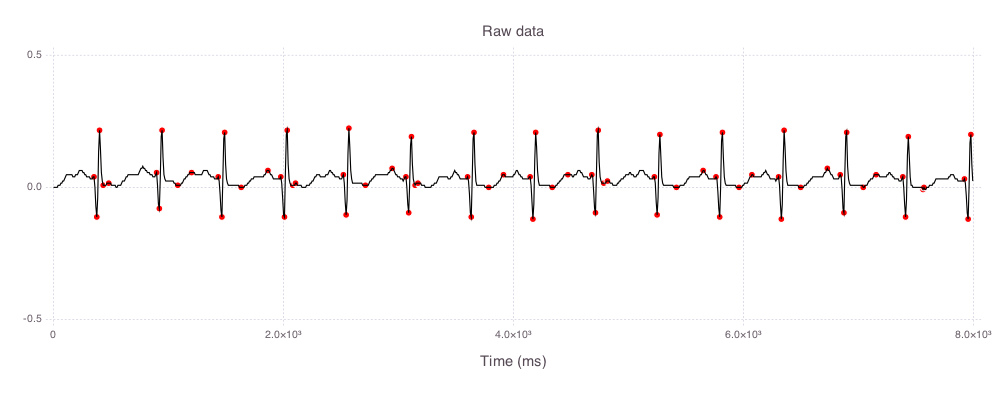

In [220]:
plotraw((inverted ? (-1):(1))*data[1:1000, :], [Ps..., Qs..., Rs..., Ss..., Ts...])

In [205]:
# Source: "ECG made easy", p 16
# Check normal QRS complex duration
abnormal = false
n_qs = min(length(Qs), length(Ss))
QSs = zeros(n_qs)
for i=1:n_qs
    Δt = (Ss[i] - Qs[i])/125
    if Δt > 0.120
        abnormal = true
        println("Abnormal QRS complex duration: ", round(Δt, 4), " s > 0.12s")
    end
    QSs[i] = Δt
end
println("Mean QRS complex duration: ", round(mean(QSs), 5), " ± ", round(std(QSs)/√(n_qs-1), 5), " s")

Abnormal QRS complex duration: 0.16 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.152 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.168 s > 0.12s
Abnormal QRS complex duration: 0.152 s > 0.12s
Mean QRS complex duration: 0.13543 ± 0.01315 s


In [219]:
# Source: "ECG made easy", p 17
# Check normal QTc duration
#
# There are several corrections used (see Wikipedia)
# Bazett's
# QTc = QT/√RR should have units of ms/s^1/2 but is always reported in ms. :(
# Fridericia
# QTc = QT/3√RR (similar units issue)
# Framingham heart study
# QTc = QT + 0.154(1-RR)

abnormal = false
n_qt = min(length(Qs), length(Ts), length(RRs))
QTs = zeros(n_qt)
QTcBs = zeros(n_qt)
QTcFs = zeros(n_qt)
QTcLs = zeros(n_qt)
for i=1:n_qs
    Δt = (Ts[i] - Qs[i])/125
    QTs[i] = Δt

    RR = RRs[i]/125
    
    ΔtB = Δt/√RR
    if ΔtB > 0.450
        abnormal = true
        println("Abnormal QTc complex duration (Bazett's correction): ", round(ΔtB, 4), " s > 0.45s")
    end
    QTcBs[i] = ΔtB

    ΔtF = Δt/∛RR
    if ΔtF > 0.450
        abnormal = true
        println("Abnormal QTc complex duration (Frederica's correction): ", round(ΔtF, 4), " s > 0.45s")
    end
    QTcFs[i] = ΔtF

    ΔtL = Δt + 0.154*(1-RR)
    if ΔtL > 0.450
        abnormal = true
        println("Abnormal QTc complex duration (Framingham correction): ", round(ΔtL, 4), " s > 0.45s")
    end
    QTcLs[i] = ΔtL

end
println("Mean QT (uncorrected) duration: ", round(mean(QTs), 5), " ± ", round(std(QTs)/√(n_qt-1), 5), " s")
println("Mean QTc (Bazett) duration: ", round(mean(QTcBs), 5), " ± ", round(std(QTcBs)/√(n_qt-1), 5), " s")
println("Mean QTc (Frederica) duration: ", round(mean(QTcFs), 5), " ± ", round(std(QTcFs)/√(n_qt-1), 5), " s")
println("Mean QTc (Framingham) duration: ", round(mean(QTcLs), 5), " ± ", round(std(QTcLs)/√(n_qt-1), 5), " s")0 

Abnormal QTc complex duration (Bazett's correction): 0.5423 s > 0.45s
Abnormal QTc complex duration (Frederica's correction): 0.49 s > 0.45s
Abnormal QTc complex duration (Framingham correction): 0.4702 s > 0.45s
Abnormal QTc complex duration (Bazett's correction): 0.5423 s > 0.45s
Abnormal QTc complex duration (Frederica's correction): 0.49 s > 0.45s
Abnormal QTc complex duration (Framingham correction): 0.4702 s > 0.45s
Abnormal QTc complex duration (Bazett's correction): 0.5423 s > 0.45s
Abnormal QTc complex duration (Frederica's correction): 0.49 s > 0.45s
Abnormal QTc complex duration (Framingham correction): 0.4702 s > 0.45s
Abnormal QTc complex duration (Bazett's correction): 0.5423 s > 0.45s
Abnormal QTc complex duration (Frederica's correction): 0.49 s > 0.45s
Abnormal QTc complex duration (Framingham correction): 0.4702 s > 0.45s
Mean QT (uncorrected) duration: 0.25486 ± 0.03436 s
Mean QTc (Bazett) duration: 0.34629 ± 0.04657 s
Mean QTc (Frederica) duration: 0.31265 ± 0.04208

In [209]:
# Source: "ECG made easy", p 102 
# Check normal Q wave duration
# longer than 1mm ÷ 25mm/s = 0.04s = myocardial infarction
#Cheat and look at QR interval
abnormal = false
n_qr = min(length(Qs), length(Rs))
QRs = zeros(n_qr)
for i=1:n_qs
    Δt = (Rs[i] - Qs[i])/125
    if Δt > 0.04
        abnormal = true
        println("Abnormal Q wave duration: ", round(Δt, 4), " s > 0.04s")
    end
    QRs[i] = Δt
end
println("Mean Q wave duration: ", round(mean(QRs), 5), " ± ", round(std(QRs)/√(n_qr-1), 5), " s")

Mean Q wave duration: 0.0224 ± 0.00166 s
